In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [3]:
import datetime as dt

In [4]:
from IPython.display import display

# Introduction

In [5]:
indexes = ['nifty 50', 'nifty 100', 'nifty 200', 'nifty 500', 'nifty midcap 50', 'nifty midcap 100', 'nifty midcap 150',
           'nifty smallcap 50', 'nifty smallcap 100', 'nifty smallcap 250']

In [6]:
nifty = pd.read_excel(indexes[3]+'.xlsx', index_col='Date')
nifty.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2495 entries, 2011-01-03 to 2021-01-25
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Total Returns Index  2495 non-null   float64
 1   P/E                  2495 non-null   float64
 2   P/B                  2495 non-null   float64
 3   Div Yield            2495 non-null   float64
dtypes: float64(4)
memory usage: 97.5 KB


In [7]:
nifty.describe()

,Total Returns Index,P/E,P/B,Div Yield
count,2495.000000,2495.000000,2495.000000,2495.000000
mean,10014.313118,24.650369,2.948281,1.309070
std,3329.381407,6.293965,0.373341,0.188802
min,4842.640000,15.110000,2.050000,0.870000
25%,6488.480000,18.685000,2.590000,1.180000
50%,9830.830000,23.940000,3.010000,1.300000
75%,13336.110000,29.420000,3.260000,1.460000
max,18321.730000,46.290000,3.900000,1.920000


In [8]:
nifty[nifty.duplicated(keep=False)]

,Total Returns Index,P/E,P/B,Div Yield
Date,,,,


Cumulative Annual Growth Rate calculation

In [9]:
# def cagr_calc(df, start, end):
#     r = (df.loc[dt.datetime(*end)]['Total Returns Index']/nifty.loc[dt.datetime(*start)]['Total Returns Index'])**(1/((dt.datetime(*end)-dt.datetime(*start)).days/365))-1
#     return round(r*100, 2)

In [10]:
def cagr_calc(df, start, end):
    start  = dt.datetime(*start)
    if start < dt.datetime(2011,1,1) or start > df.index[-1]:
        return print(f"start value should be between {df.index[0].date()} and {df.index[-1].date()}")
    
    initial_value = None
    while not initial_value:
        try:
            initial_value = df.loc[start]['Total Returns Index']
        except KeyError:
            start += dt.timedelta(days=1)
    
    end  = dt.datetime(*end)
    if end < df.index[0]:
        return print(f"end value should be greater than {df.index[0].date()}")
    
    final_value = None
    while not final_value:
        try:
            final_value = df.loc[end]['Total Returns Index']
        except KeyError:
            end -= dt.timedelta(days=1)
        
    r = (df.loc[end]['Total Returns Index']/df.loc[start]['Total Returns Index'])**(1/((end-start).days/365))-1
    return round(r*100, 2), f'between {start.date()} and {end.date()}'

In [14]:
cagr = cagr_calc(nifty, (2021,1,1), (2021,1,27))
cagr

(24.91, 'between 2021-01-01 and 2021-01-25')

# Data Visualization

In [15]:
nifty['day'] = nifty.index.day_name()
nifty.groupby(nifty['day']).count()

,Total Returns Index,P/E,P/B,Div Yield
day,,,,
Friday,492,492,492,492
Monday,496,496,496,496
Saturday,9,9,9,9
Sunday,3,3,3,3
Thursday,495,495,495,495
Tuesday,500,500,500,500
Wednesday,500,500,500,500


<AxesSubplot:>

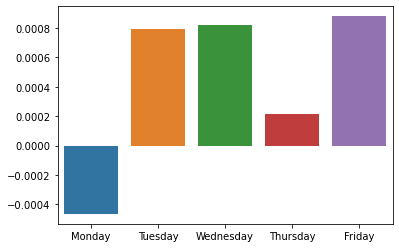

In [16]:
dd = nifty['Total Returns Index'].pct_change().groupby(nifty['day']).mean()
days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
dd.index = pd.Categorical(dd.index, categories=days[:5], ordered=True)
sns.barplot(x=dd.index, y=dd.values)

<AxesSubplot:>

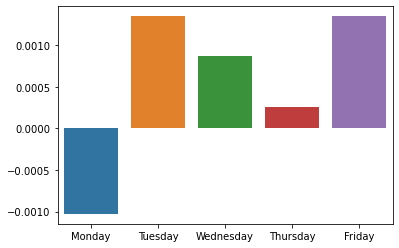

In [17]:
dd = nifty.loc[dt.datetime(2016,1,1):]['Total Returns Index'].pct_change().groupby(nifty['day']).mean()
days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
dd.index = pd.Categorical(dd.index, categories=days[:5], ordered=True)
sns.barplot(x=dd.index, y=dd.values)

<AxesSubplot:>

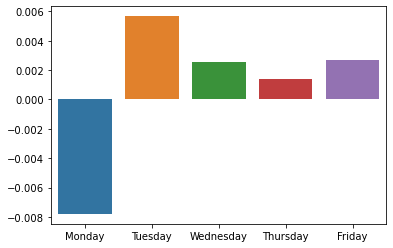

In [18]:
dd = nifty.loc[dt.datetime(2020,1,1):]['Total Returns Index'].pct_change().groupby(nifty['day']).mean()
days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
dd.index = pd.Categorical(dd.index, categories=days[:5], ordered=True)
sns.barplot(x=dd.index, y=dd.values)

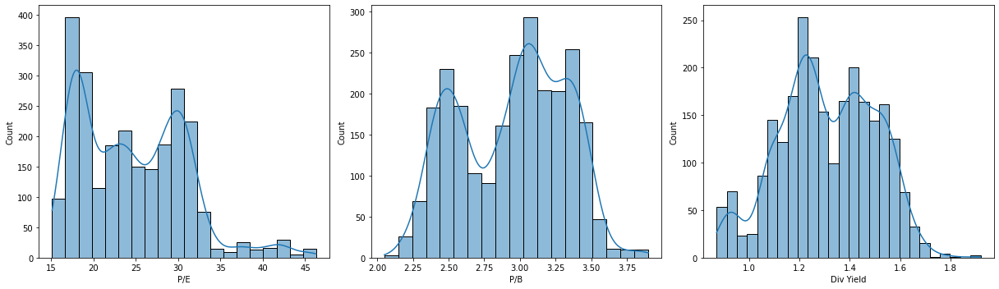

In [21]:
fig, axes = plt.subplots(1,3, figsize=(17,5))
for i, ax in enumerate(axes):
    sns.histplot(nifty[nifty.columns[i+1]], ax=ax, kde=True)
plt.tight_layout()

<AxesSubplot:xlabel='Total Returns Index', ylabel='Count'>

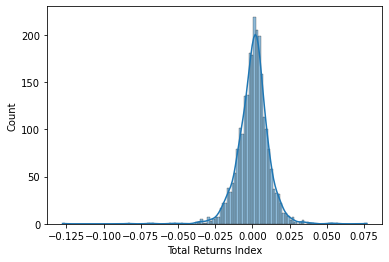

In [22]:
sns.histplot(nifty['Total Returns Index'].pct_change(), kde=True)

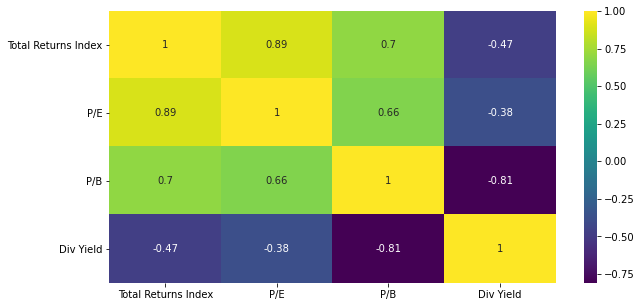

In [23]:
plt.figure(figsize=(10,5))
ax = sns.heatmap(data=nifty[1000:].corr(), annot=True, cmap='viridis')

<AxesSubplot:xlabel='Date', ylabel='P/E'>

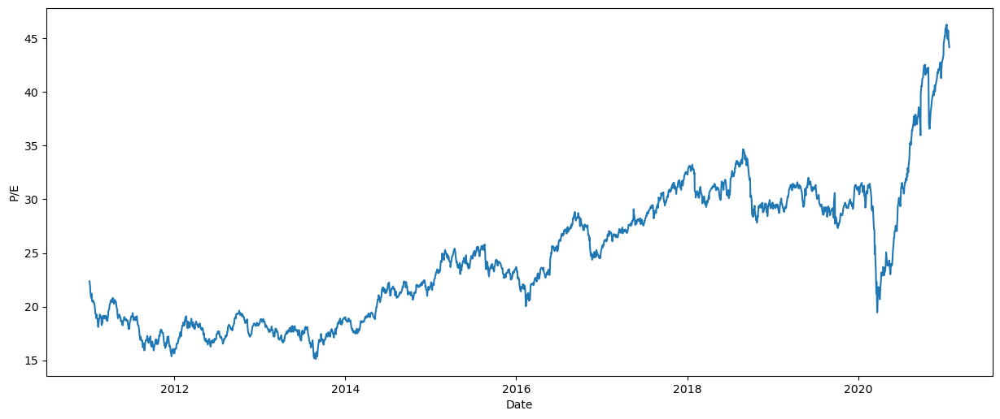

In [24]:
plt.figure(figsize=(15,6), dpi=100)
sns.lineplot(data=nifty['P/E'])

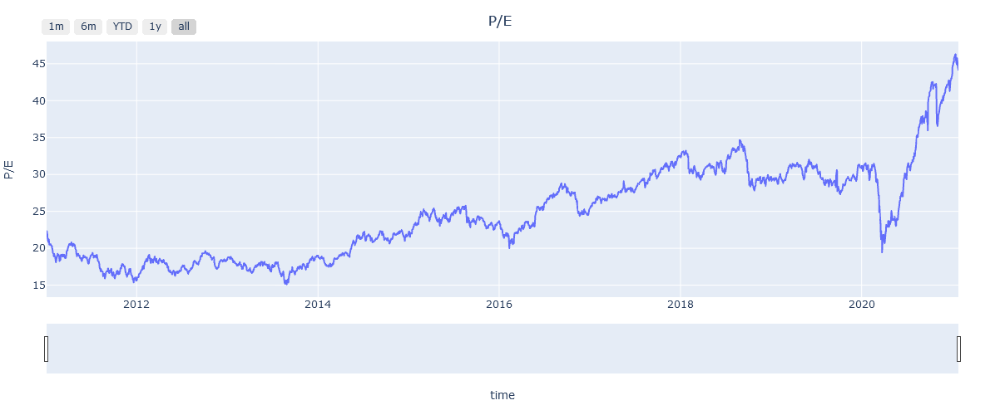

In [25]:
fig = px.line(nifty, x=nifty.index, y="P/E", title='P/E', height=500)
fig.update_layout(
    title={'text': "P/E", 'x':0.5, 'y':0.95, 'xanchor':'center', 'yanchor':'middle'},  xaxis_title='time', yaxis_title='P/E', margin=dict(l=50, r=50, b=50, t=50))
fig.update_xaxes(rangeslider_visible=True, 
                 rangeselector=dict(buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])))
fig.show()

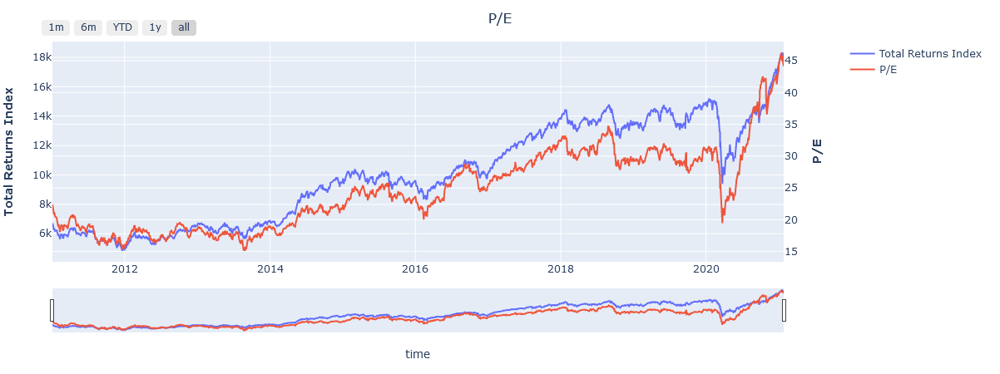

In [26]:
fig = go.Figure()
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=nifty.index, y=nifty["Total Returns Index"], name='Total Returns Index'))
fig.add_trace(go.Scatter(x=nifty.index, y=nifty["P/E"], name='P/E'), secondary_y=True)
fig.update_layout(
    title={'text': "P/E", 'x':0.5, 'y':0.95, 'xanchor':'center', 'yanchor':'middle'},  xaxis_title='time', yaxis_title='P/E', margin=dict(l=50, r=50, b=50, t=50))
fig.update_xaxes(rangeslider_visible=True, rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])))
fig.update_yaxes(title_text="<b>Total Returns Index</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>P/E</b>", secondary_y=True)
fig.show()

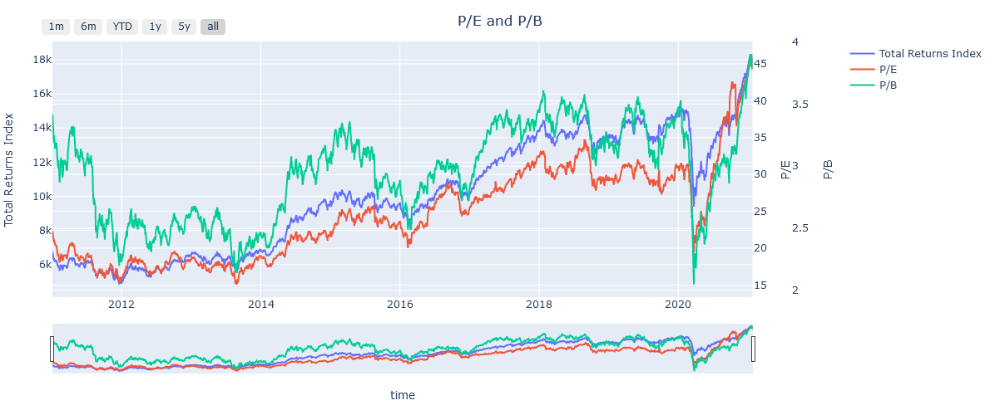

In [28]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=nifty.index, y=nifty["Total Returns Index"], name='Total Returns Index'))
fig.add_trace(go.Scatter(x=nifty.index, y=nifty["P/E"], name='P/E', yaxis='y2'))
fig.add_trace(go.Scatter(x=nifty.index, y=nifty["P/B"], name='P/B', yaxis='y3'))

fig.update_layout(xaxis=dict(domain=[0.0, 0.9]),
                  yaxis=dict(title="Total Returns Index"), yaxis2=dict(title = 'P/E', anchor="x", overlaying="y", side="right"),
                  yaxis3=dict(title = 'P/B', anchor="free", overlaying="y", side="right", position=.95),
    title={'text': "P/E and P/B", 'x':0.5,'y':0.95, 'xanchor':'center','yanchor':'middle'},xaxis_title='time', margin=dict(l=50, r=50, b=50, t=50), height=500)

fig.update_xaxes(rangeslider_visible=True, 
                 rangeselector=dict(buttons=list([
                    dict(count=1, label="1m", step="month", stepmode="backward"),
                    dict(count=6, label="6m", step="month", stepmode="backward"),
                    dict(count=1, label="YTD", step="year", stepmode="todate"),
                    dict(count=1, label="1y", step="year", stepmode="backward"),
                    dict(count=5, label="5y", step="year", stepmode="backward"),
                    dict(step="all")])))

fig.show()

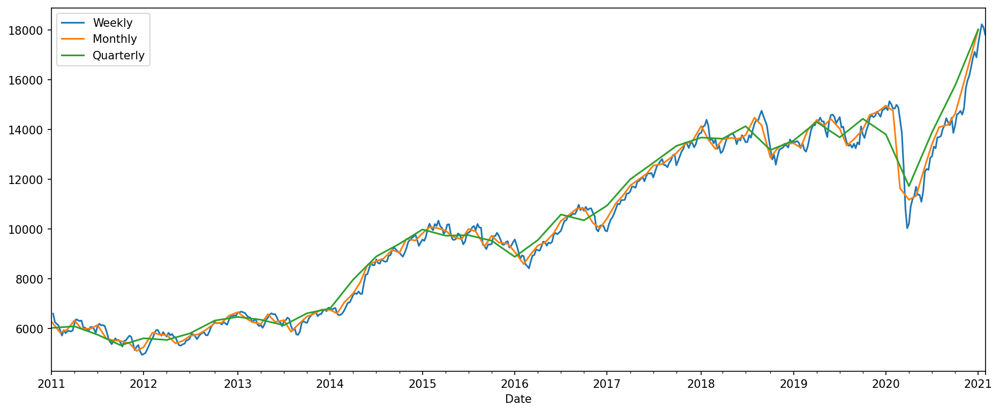

In [20]:
plt.figure(figsize=(15,6), dpi=150)
nifty.resample('W').mean()['Total Returns Index'].plot(label = 'Weekly')
nifty.resample('M').mean()['Total Returns Index'].plot(label = 'Monthly')
nifty.resample('Q').mean()['Total Returns Index'].plot(label = 'Quarterly')
plt.legend()
plt.show()

In [29]:
def compare(index_list):
    fig, ax = plt.subplots(1,1,figsize=(15,7), dpi = 150)
    ax2 = ax.twinx()
    for i in index_list:
        nifty = pd.read_excel(i + '.xlsx', index_col='Date')
        sns.lineplot(x=nifty.index, y=nifty['P/E'], data=nifty, label=i+' P/E', ax=ax)
        ax.legend(loc=0)
        
        ax2._get_lines.prop_cycler = ax._get_lines.prop_cycler
        sns.lineplot(x=nifty.index, y=nifty['P/B'], data=nifty, label=i+' P/B', ax=ax2, markers=True, dashes=False)
        ax2.set_ylim(2,4)
        ax2.legend(loc='lower right')
        

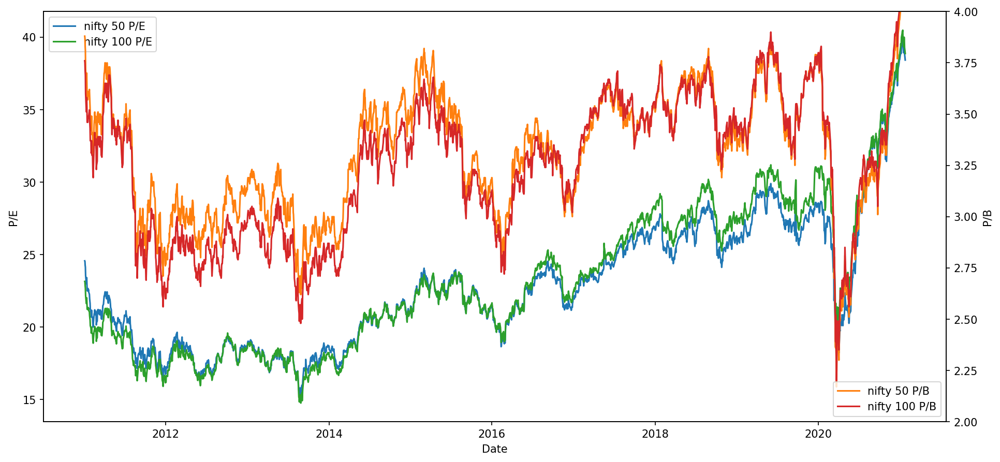

In [30]:
compare(indexes[:2])

In [31]:
def compare(index_list):
    fig, ax = plt.subplots(1,1,figsize=(15,7), dpi = 150)
    ax2 = ax.twinx()
    for i in index_list:
        nifty = pd.read_excel(i + '.xlsx', index_col='Date')
        ax.plot(nifty.index, nifty['P/E'], label= i + ' P/E')
        ax.set_ylabel('P/E')
        ax.legend()
    
        ax2._get_lines.prop_cycler = ax._get_lines.prop_cycler
        ax2.plot(nifty.index, nifty['P/B'], label= i + ' P/B')
        ax2.set_ylabel('P/B')
        ax2.set_ylim(2,4)
        ax2.legend(bbox_to_anchor=(1,1), loc=2)


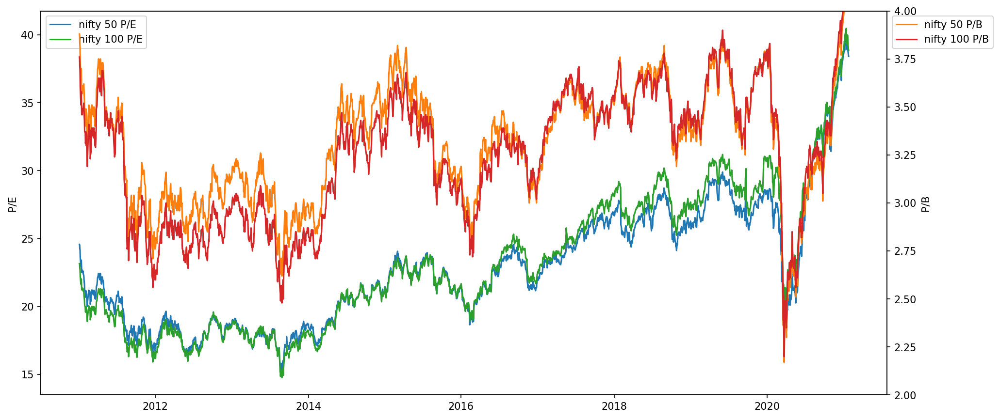

In [32]:
compare(indexes[:2])

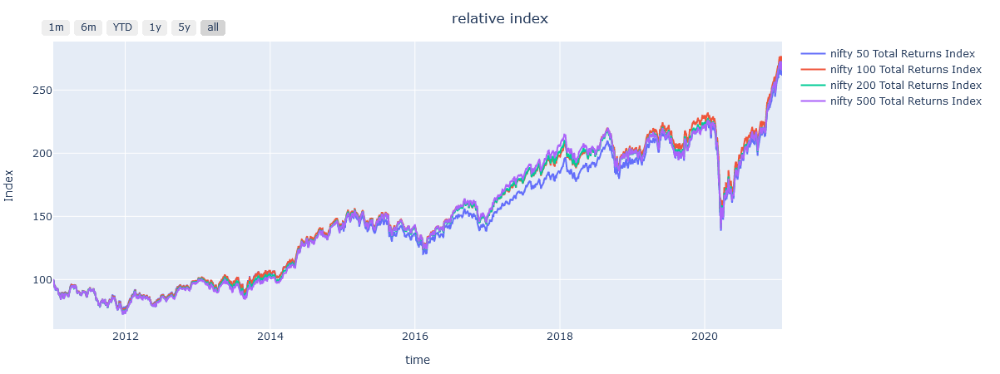

In [18]:
fig = go.Figure()
for i in indexes[:4]:
    nifty = pd.read_excel(i + '.xlsx', index_col='Date')
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty['Total Returns Index']/nifty['Total Returns Index'][0]*100, name=i+' Total Returns Index'))

fig.update_layout(
    title={'text': "relative index", 'x':0.5, 'y':0.95, 'xanchor':'center', 'yanchor':'middle'},  xaxis_title='time', yaxis_title='Index', margin=dict(l=50, r=50, b=50, t=50))
fig.update_xaxes(rangeselector=dict(buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=5, label="5y", step="year", stepmode="backward"),
            dict(step="all")
        ])))
fig.show()

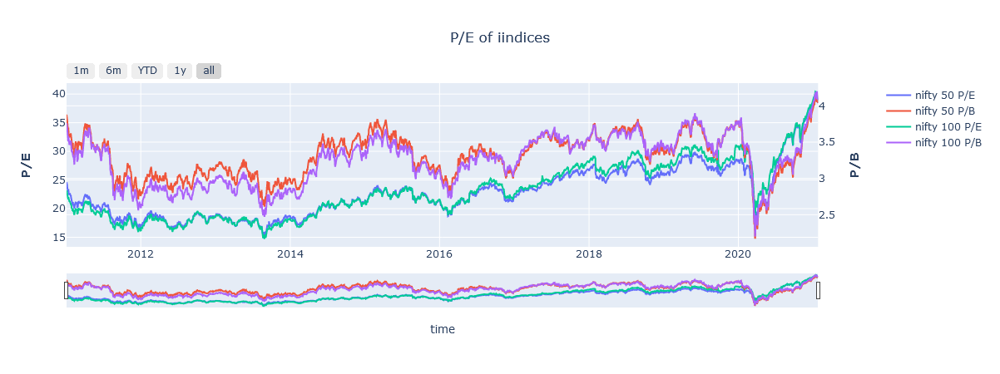

In [33]:
fig = go.Figure()
fig = make_subplots(specs=[[{"secondary_y": True}]])
for i in indexes[:2]:
    nifty = pd.read_excel(i + '.xlsx', index_col='Date')
    
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty['P/E'], name=i+' P/E'))
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty['P/B'], name=i+' P/B'), secondary_y=True)
    
fig.update_layout(title={'text': "P/E of iindices", 'y':0.9, 'x':0.5, 'xanchor': 'center', 'yanchor': 'middle'}, xaxis_title='time')
fig.update_xaxes(rangeslider_visible=True, rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])))
fig.update_yaxes(title_text="<b>P/E</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>P/B</b>", secondary_y=True)

fig.show()

In [37]:
def compare(index_list, metric):
    fig, ax = plt.subplots(1,1,figsize=(15,7), dpi = 150)
    for i in index_list:
        nifty = pd.read_excel(i + '.xlsx', index_col='Date')
        ax.plot(nifty.index[-300:], nifty[metric][-300:], label= i +' '+ metric)
        ax.set_ylabel(metric)
        ax.legend()

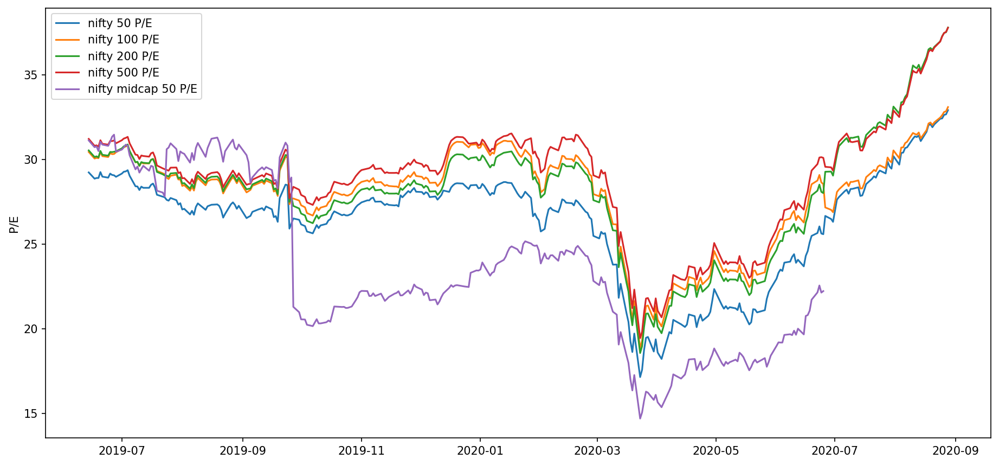

In [38]:
compare(indexes[:5], 'P/E')

yearly correlations between returns and metric

In [43]:
for i in range(0, nifty['P/B'].count(), 249):
    print(nifty.index[i].date(), nifty['next 1y returns'].iloc[i], 
          nifty['P/B'].iloc[i:i+249].corr(nifty['next 1y returns'].iloc[i:i+249]))

2011-01-03 -23.130845170495583 -0.9436213189889846
2012-01-04 30.031449494816663 -0.6597095570649347
2013-01-01 6.981451568626884 -0.8158262035829922
2013-12-31 31.981957039928144 -0.9380658105174623
2015-01-07 -3.0578132690452065 -0.8616266193380395
2016-01-08 12.448700843586114 -0.45639521781948184
2017-01-11 30.900169995710215 -0.3551864247609395
2018-01-11 1.2217220852960953 -0.741329500150735
2019-01-16 11.480761492379976 -0.8033817452132245
2020-01-22 nan nan


In [44]:
nifty['P/E'].iloc[:1000].corr(nifty['next 1y returns'].iloc[:1000])

-0.6849313104946829

In [45]:
nifty['P/E'].iloc[1000:].corr(nifty['next 1y returns'].iloc[1000:])

-0.5208822101846596

In [46]:
nifty['Div Yield'].corr(nifty['next 1y returns'])

0.6002377939924222

In [71]:
def compare_three(y1, y2, y3):
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=nifty.index, y=nifty_with_returns[y1], name=y1))
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty_with_returns[y2], name=y2, yaxis='y2'))
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty_with_returns[y3], name=y3, yaxis='y3'))

    fig.update_layout(xaxis=dict(domain=[0.0, 0.9]),
                      yaxis=dict(title=y1), 
                      yaxis2=dict(title = y2, anchor="x", overlaying="y", side="right"),
                      yaxis3=dict(title = y3, anchor="free", overlaying="y", side="right", position=.95),
        title={'text': y1+' '+y2+' '+y3, 'x':0.5,'y':0.95, 'xanchor':'center','yanchor':'middle'},xaxis_title='time', margin=dict(l=50, r=50, b=50, t=50), height=500)

    fig.update_layout(hovermode="x unified")

    fig.update_xaxes(rangeslider_visible=True, 
                     rangeselector=dict(buttons=list([
                        dict(count=1, label="1m", step="month", stepmode="backward"),
                        dict(count=6, label="6m", step="month", stepmode="backward"),
                        dict(count=1, label="YTD", step="year", stepmode="todate"),
                        dict(count=1, label="1y", step="year", stepmode="backward"),
                        dict(count=5, label="5y", step="year", stepmode="backward"),
                        dict(step="all")])))
    fig.show()

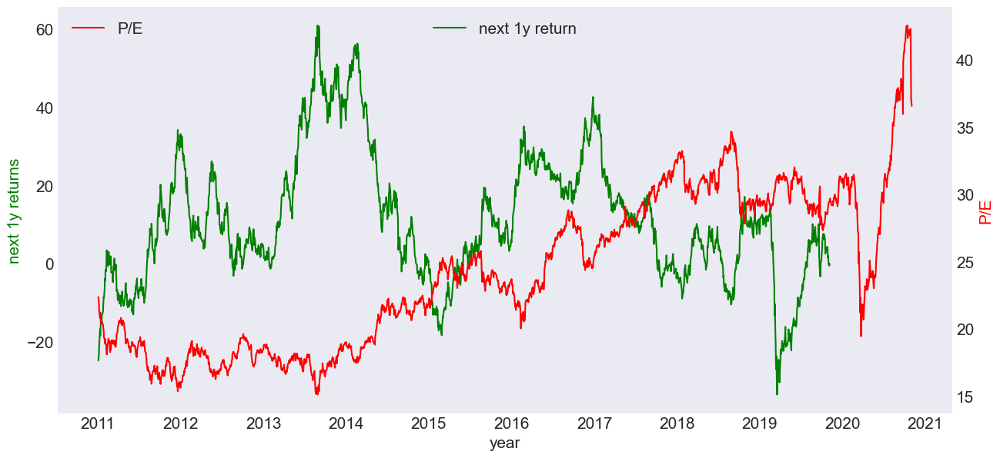

In [10]:
plt.style.use('seaborn-dark')
# sns.set()
fig, ax1 = plt.subplots(1,1,figsize=(15,7), dpi = 100)
ax1.plot(nifty.index, nifty['next 1y returns'], '-g', label='next 1y return')
ax1.set_xlabel('year', fontsize=15)
ax1.tick_params(axis='x', labelsize=15)
ax1.set_ylabel('next 1y returns',fontsize=15, color='g')
ax1.tick_params(axis='y', labelsize=15)
ax1.legend(loc='upper center', fontsize=15)

ax2 = ax1.twinx()
ax2.plot(nifty.index, nifty['P/E'], '-r', label='P/E')
ax2.set_ylabel('P/E',fontsize=15, color='r')
ax2.tick_params(axis='y', labelsize=15)
ax2.legend(loc='upper left', fontsize=15)

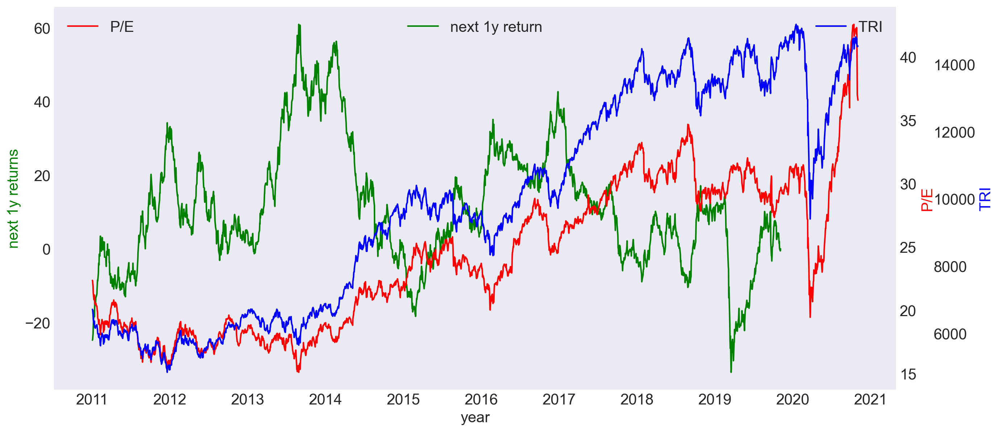

In [25]:
plt.style.use('seaborn-dark')
fig, ax1 = plt.subplots(1,1,figsize=(15,7), dpi = 200)
ax1.plot(nifty.index, nifty['next 1y returns'], '-g', label='next 1y return')
ax1.set_xlabel('year', fontsize=15)
ax1.tick_params(axis='x', labelsize=15)
ax1.set_ylabel('next 1y returns',fontsize=15, color='g')
ax1.tick_params(axis='y', labelsize=15)
ax1.legend(loc='upper center', fontsize=15)

ax2 = ax1.twinx()
ax2.plot(nifty.index, nifty['P/E'], '-r', label='P/E')
ax2.set_ylabel('P/E',fontsize=15, color='r')
ax2.tick_params(axis='y', labelsize=15)
ax2.legend(loc='upper left', fontsize=15)

ax3 = ax1.twinx()
ax3.spines['right'].set_position(('axes', 1.04))
ax3.plot(nifty.index, nifty['Total Returns Index'], '-b', label='TRI')
ax3.set_ylabel('TRI',fontsize=15, color='b')
ax3.tick_params(axis='y', labelsize=15)
ax3.legend(loc='upper right', fontsize=15)

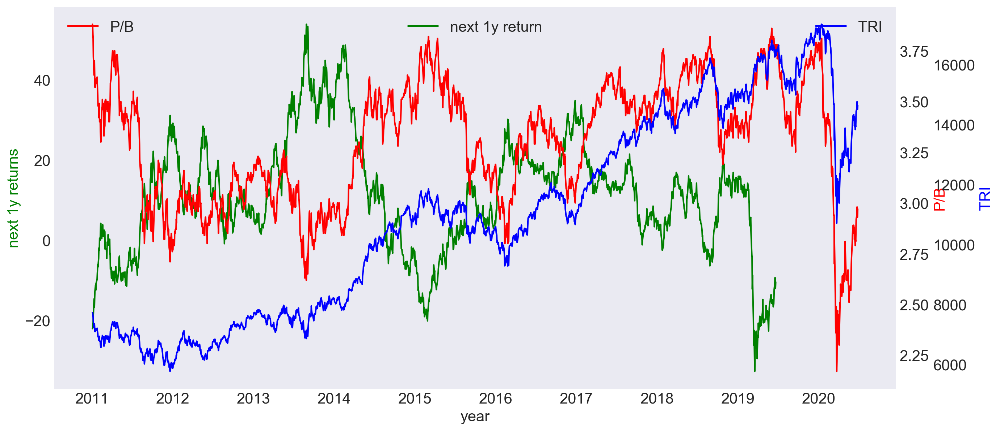

In [44]:
plt.style.use('seaborn-dark')
fig, ax1 = plt.subplots(1,1,figsize=(15,7), dpi = 200)
ax1.plot(nifty.index, nifty['next 1y returns'], '-g', label='next 1y return')
ax1.set_xlabel('year', fontsize=15)
ax1.tick_params(axis='x', labelsize=15)
ax1.set_ylabel('next 1y returns',fontsize=15, color='g')
ax1.tick_params(axis='y', labelsize=15)
ax1.legend(loc='upper center', fontsize=15)

ax2 = ax1.twinx()
ax2.plot(nifty.index, nifty['P/B'], '-r', label='P/B')
ax2.set_ylabel('P/B',fontsize=15, color='r')
ax2.tick_params(axis='y', labelsize=15)
ax2.legend(loc='upper left', fontsize=15)

ax3 = ax1.twinx()
ax3.spines['right'].set_position(('axes', 1.04))
ax3.plot(nifty.index, nifty['Total Returns Index'], '-b', label='TRI')
ax3.set_ylabel('TRI',fontsize=15, color='b')
ax3.tick_params(axis='y', labelsize=15)
ax3.legend(loc='upper right', fontsize=15)

# yealy returns

In [49]:
nifty_yearly = pd.DataFrame()

In [50]:
nifty_yearly['last 1 year returns'] = nifty['Total Returns Index'].pct_change(periods=249)

In [51]:
nifty_yearly['last 2 year returns'] = nifty['Total Returns Index'].pct_change(periods=249*2)

In [52]:
nifty_yearly['last 3 year returns'] = nifty['Total Returns Index'].pct_change(periods=249*3)

In [53]:
nifty_yearly['last 4 year returns'] = nifty['Total Returns Index'].pct_change(periods=249*4)

In [54]:
nifty_yearly['last 5 year returns'] = nifty['Total Returns Index'].pct_change(periods=249*5)

In [55]:
nifty_yearly.iloc[249*2]

last 1 year returns    0.300314
last 2 year returns   -0.000459
last 3 year returns         NaN
last 4 year returns         NaN
last 5 year returns         NaN
Name: 2013-01-01 00:00:00, dtype: float64

In [56]:
nifty_yearly['next 1 year returns'] = nifty_yearly['last 1 year returns'].shift(periods=-249)

In [57]:
nifty_yearly['next 2 year returns'] = nifty_yearly['last 2 year returns'].shift(periods=-249*2)

In [58]:
nifty_yearly['next 3 year returns'] = nifty_yearly['last 3 year returns'].shift(periods=-249*3)

In [59]:
nifty_yearly['next 4 year returns'] = nifty_yearly['last 4 year returns'].shift(periods=-249*4)

In [60]:
nifty_yearly['next 5 year returns'] = nifty_yearly['last 5 year returns'].shift(periods=-249*5)

In [61]:
nifty_yearly

,last 1 year returns,last 2 year returns,last 3 year returns,last 4 year returns,last 5 year returns,next 1 year returns,next 2 year returns,next 3 year returns,next 4 year returns,next 5 year returns
Date,,,,,,,,,,
2011-01-03,NaN,NaN,NaN,NaN,NaN,-0.231308,-0.000459,0.069323,0.411314,0.368158
2011-01-04,NaN,NaN,NaN,NaN,NaN,-0.229283,0.008816,0.072098,0.438289,0.363028
2011-01-05,NaN,NaN,NaN,NaN,NaN,-0.220477,0.023134,0.068771,0.461292,0.368614
2011-01-06,NaN,NaN,NaN,NaN,NaN,-0.215680,0.030978,0.075511,0.478089,0.385154
2011-01-07,NaN,NaN,NaN,NaN,NaN,-0.197250,0.051467,0.098290,0.509100,0.411859
...,...,...,...,...,...,...,...,...,...,...
2020-08-24,0.065564,0.023728,0.188221,0.391418,0.421369,NaN,NaN,NaN,NaN,NaN
2020-08-25,0.083184,0.016816,0.176619,0.379266,0.427542,NaN,NaN,NaN,NaN,NaN
2020-08-26,0.080929,0.027923,0.183231,0.390594,0.446642,NaN,NaN,NaN,NaN,NaN


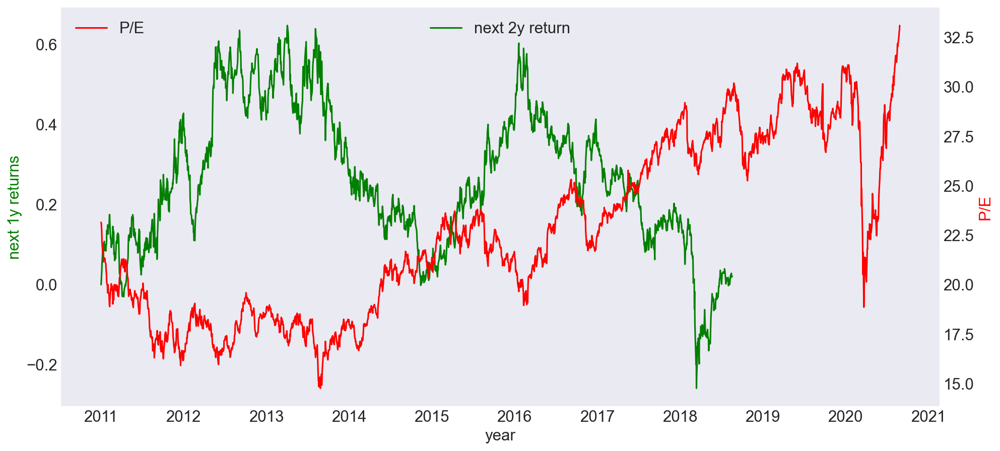

In [62]:
plt.style.use('seaborn-dark')
# sns.set()
fig, ax1 = plt.subplots(1,1,figsize=(15,7), dpi = 150)
ax1.plot(nifty_yearly.index, nifty_yearly['next 2 year returns'], '-g', label='next 2y return')
ax1.set_xlabel('year', fontsize=15)
ax1.tick_params(axis='x', labelsize=15)
ax1.set_ylabel('next 1y returns',fontsize=15, color='g')
ax1.tick_params(axis='y', labelsize=15)
ax1.legend(loc='upper center', fontsize=15)

ax2 = ax1.twinx()
ax2.plot(nifty.index, nifty['P/E'], '-r', label='P/E')
ax2.set_ylabel('P/E',fontsize=15, color='r')
ax2.tick_params(axis='y', labelsize=15)
ax2.legend(loc='upper left', fontsize=15)

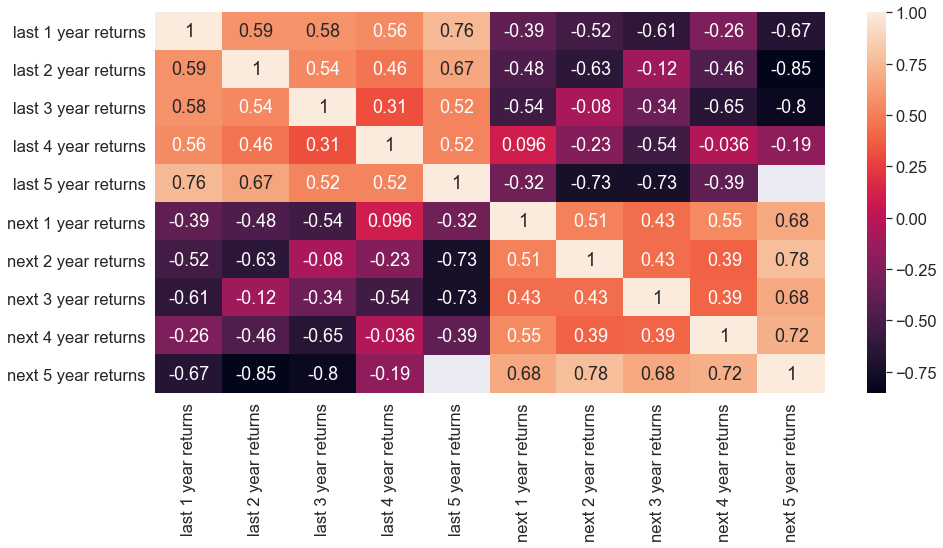

In [63]:
plt.figure(figsize = (15,7))
sns.set(font_scale=1.5)
sns.heatmap(nifty_yearly.corr(), annot=True)

In [64]:
pd.concat([nifty, nifty_yearly], axis=1).iloc[1000:, :]

,Total Returns Index,P/E,P/B,Div Yield,last 1y returns,next 1y returns,last 1 year returns,last 2 year returns,last 3 year returns,last 4 year returns,last 5 year returns,next 1 year returns,next 2 year returns,next 3 year returns,next 4 year returns,next 5 year returns
Date,,,,,,,,,,,,,,,,
2015-01-13,10005.12,21.13,3.35,1.23,37.404467,-6.443601,0.374045,0.435232,0.879913,0.509100,NaN,-0.064436,0.068474,0.406362,0.412557,0.569481
2015-01-14,9982.57,21.07,3.35,1.24,37.862140,-7.665862,0.378621,0.429443,0.833548,0.543390,NaN,-0.076659,0.074005,0.409901,0.404348,0.582535
2015-01-15,10223.17,21.58,3.43,1.21,40.884874,-11.106438,0.408849,0.470581,0.870820,0.582826,NaN,-0.111064,0.051214,0.386678,0.373489,0.531247
2015-01-16,10254.25,21.64,3.44,1.20,41.619008,-10.340786,0.416190,0.476052,0.883591,0.558809,NaN,-0.103408,0.036575,0.391790,0.359318,0.516755
2015-01-19,10297.97,21.69,3.45,1.20,42.221832,-12.258824,0.422218,0.488914,0.877931,0.591900,NaN,-0.122588,0.038115,0.399927,0.337314,0.470580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-08-24,15064.45,32.48,3.27,1.39,6.556374,NaN,0.065564,0.023728,0.188221,0.391418,0.421369,NaN,NaN,NaN,NaN,NaN
2020-08-25,15072.84,32.62,3.27,1.39,8.318392,NaN,0.083184,0.016816,0.176619,0.379266,0.427542,NaN,NaN,NaN,NaN,NaN
2020-08-26,15165.03,32.81,3.29,1.38,8.092872,NaN,0.080929,0.027923,0.183231,0.390594,0.446642,NaN,NaN,NaN,NaN,NaN


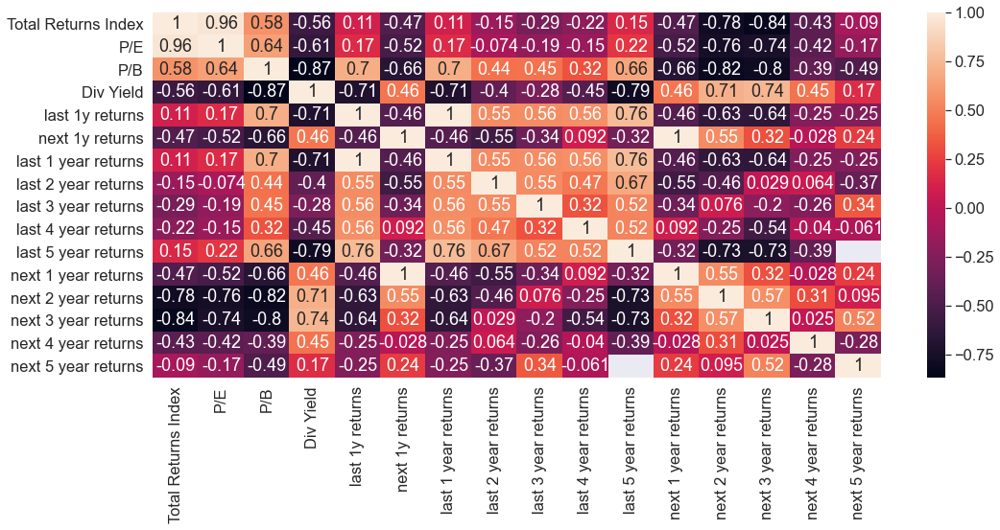

In [65]:
plt.figure(figsize = (17,7))
sns.set(font_scale=1.5)
sns.heatmap((pd.concat([nifty, nifty_yearly], axis=1)).iloc[1000:, :].corr(), annot=True)

# Linear Regression

In [1]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [15]:
X = nifty[1000:].dropna()[['P/E', 'P/B', 'Div Yield']]
Y = nifty[1000:].dropna()['next 1y returns']

In [68]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.25, random_state=101)

In [69]:
model = LinearRegression()

In [70]:
model.fit(X_train, Y_train)

LinearRegression()

In [71]:
model.coef_

array([ -0.34256581, -50.47751905, -30.295191  ])

In [72]:
model.score(X_test, Y_test)

0.46605521639624725

In [73]:
pred = model.predict(X_test)

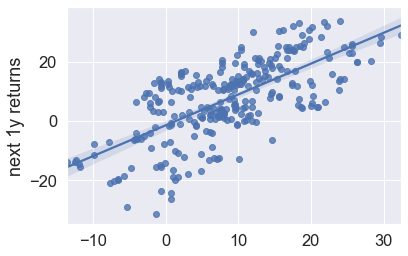

In [74]:
sns.regplot(pred, Y_test)

In [75]:
nifty.tail(1)

,Total Returns Index,P/E,P/B,Div Yield,last 1y returns,next 1y returns
Date,,,,,,
2020-08-28,15291.38,33.1,3.32,1.37,6.195965,NaN


In [76]:
nifty.tail(1).values[0][1:4]

array([33.1 ,  3.32,  1.37])

In [77]:
arr = nifty.tail(1).values[0][1:4]

In [78]:
model.predict(arr.reshape(1,-1))

array([7.81879621])

# Statsmodels Prediction

In [7]:
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5

In [8]:
from sklearn.metrics import mean_squared_error

In [9]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [10]:
from statsmodels.tsa.seasonal import seasonal_decompose, STL

In [11]:
from statsmodels.tsa.stattools import adfuller

In [15]:
from statsmodels.tsa.arima.model import ARIMA

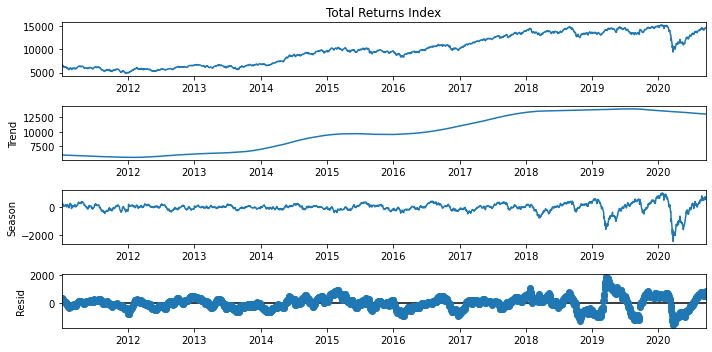

In [18]:
res = STL(nifty['Total Returns Index'], period=249)
res.fit().plot();

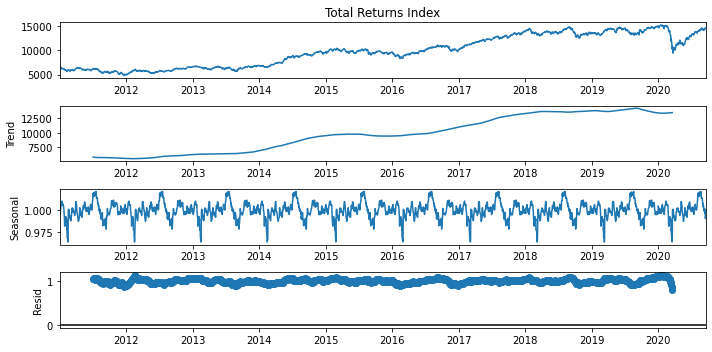

In [19]:
res = seasonal_decompose(nifty['Total Returns Index'], period=250, model="multiplicative")
res.plot();

<Figure size 720x720 with 0 Axes>

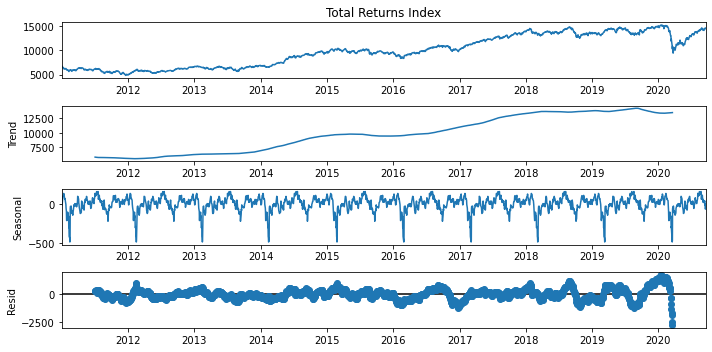

In [20]:
plt.figure(figsize=(10,10))
res = seasonal_decompose(nifty['Total Returns Index'], period=250, model="additive")
res.plot();

In [21]:
adfuller(nifty['Total Returns Index'])

(-0.8682030295519433,
 0.7982632298341563,
 12,
 2394,
 {'1%': -3.433084471827723,
  '5%': -2.862748051618385,
  '10%': -2.5674130966374444},
 28928.107979124008)

<AxesSubplot:xlabel='Date'>

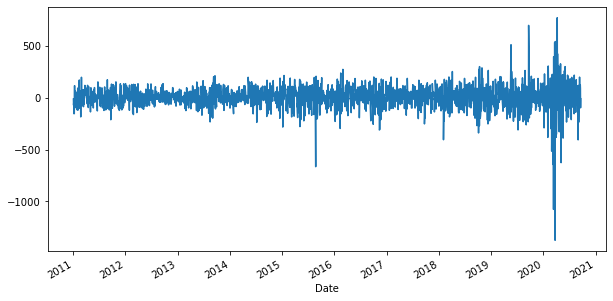

In [22]:
nifty['Total Returns Index'].diff().dropna().plot()

In [23]:
adfuller(nifty['Total Returns Index'].diff().dropna())

(-12.366933387794584,
 5.388018600882234e-23,
 11,
 2394,
 {'1%': -3.433084471827723,
  '5%': -2.862748051618385,
  '10%': -2.5674130966374444},
 28914.394727979085)

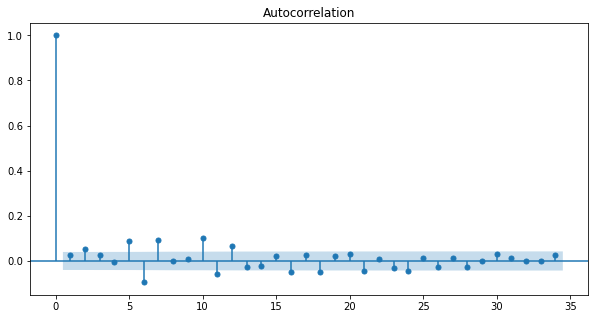

In [24]:
plot_acf(nifty['Total Returns Index'].diff().dropna());

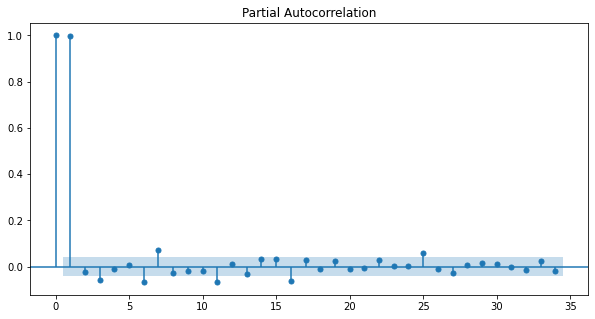

In [25]:
plot_pacf(nifty['Total Returns Index'].dropna());

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

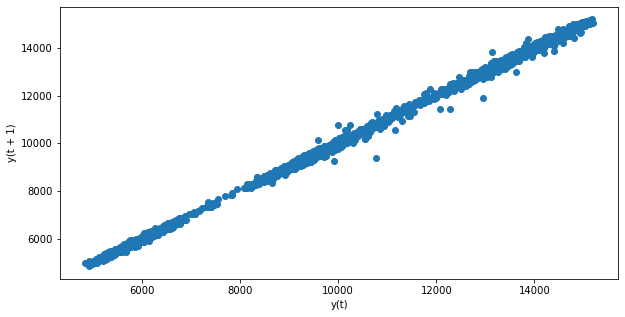

In [26]:
pd.plotting.lag_plot(nifty['Total Returns Index'])

In [33]:
ARIMA(nifty['Total Returns Index'].dropna(), order=(1,1,0)).fit().aic

C:\Users\dsanr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
C:\Users\dsanr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
C:\Users\dsanr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


29324.823746366135

In [52]:
nifty['Total Returns Index'].shape

(2407,)

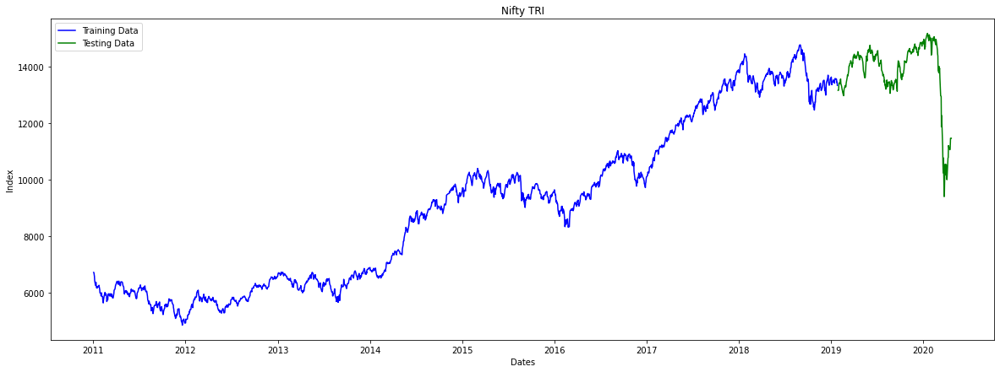

In [53]:
train_data, test_data = nifty['Total Returns Index'][0:2000], nifty['Total Returns Index'][2000:2300]
plt.figure(figsize=(20,7))
plt.title('Nifty TRI')
plt.xlabel('Dates')
plt.ylabel('Index')
plt.plot(train_data, 'blue', label='Training Data')
plt.plot(test_data, 'green', label='Testing Data')
plt.legend()

In [54]:
train_ar = train_data.values
test_ar = test_data.values
history = [x for x in train_ar]
predictions = list()
for t in range(len(test_ar)):
    model = ARIMA(history, order=(1,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test_ar[t]
    history.append(obs)
error = mean_squared_error(test_ar, predictions)
print('Testing Mean Squared Error: %.3f' % error)
# error2 = smape_kun(test_ar, predictions)
# print('Symmetric mean absolute percentage error: %.3f' % error2)

Testing Mean Squared Error: 39022.479


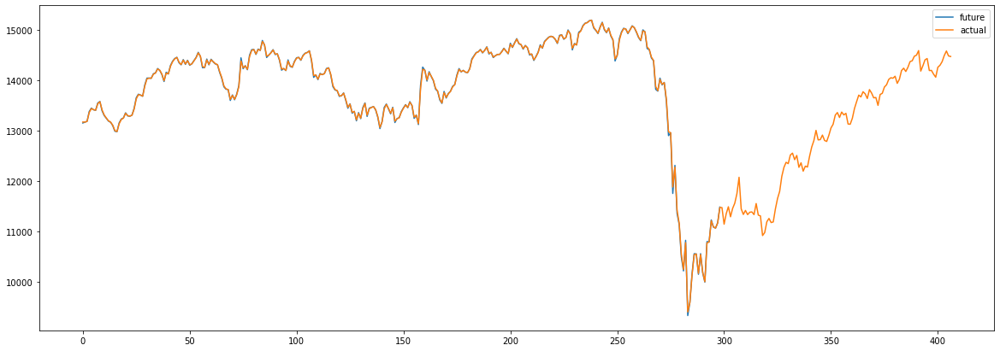

In [56]:
plt.figure(figsize=(20,7))
plt.plot(predictions[1:], label='future')
plt.plot(nifty['Total Returns Index'].iloc[2000:].values, label='actual')
plt.legend()

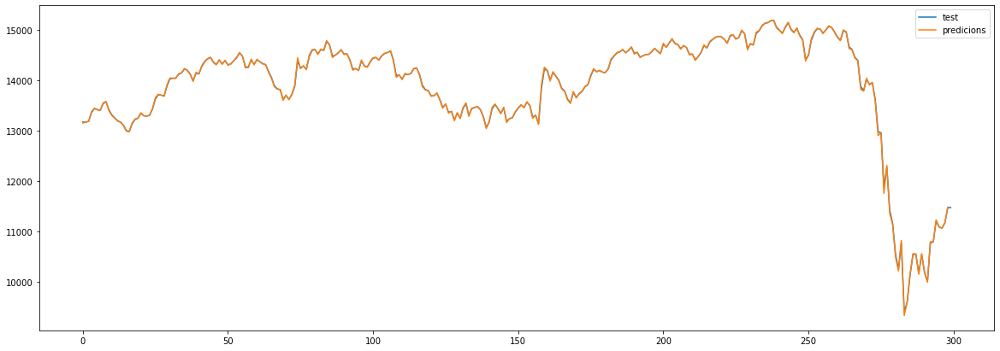

In [57]:
plt.figure(figsize=(20,7))
plt.plot(test_ar, label='test')
plt.plot(predictions[1:], label='predicions')
plt.legend()

In [58]:
future = []
history = [x for x in train_ar]
for t in range(30):
    model = ARIMA(history, order=(1,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    future.append(yhat)
    history.append(nifty['Total Returns Index'].iloc[2250:].values[t])

<AxesSubplot:>

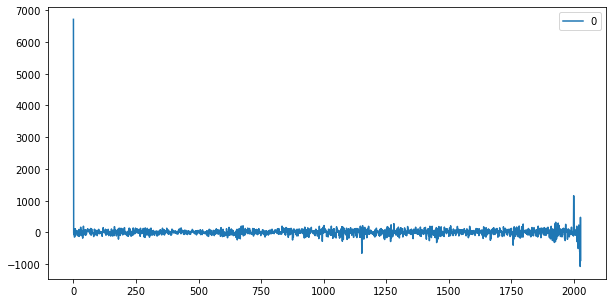

In [59]:
pd.DataFrame(model_fit.resid).plot()

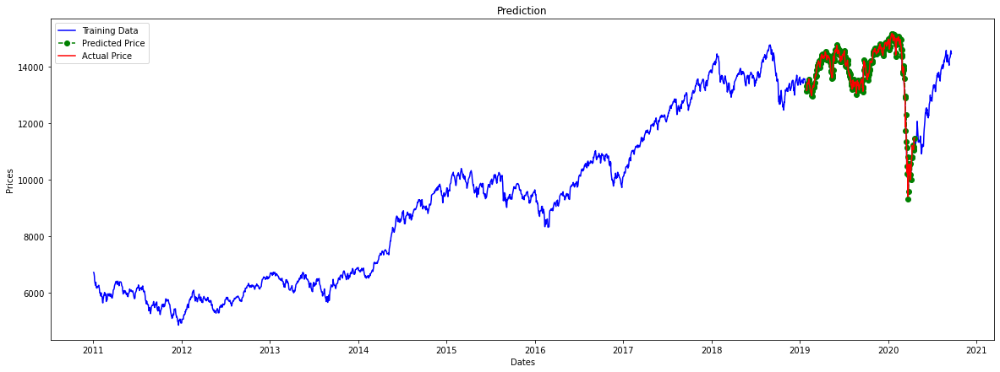

In [60]:
plt.figure(figsize=(20,7))
plt.plot(nifty['Total Returns Index'], 'green', color='blue', label='Training Data')
plt.plot(test_data.index, predictions, color='green', marker='o', linestyle='dashed', 
         label='Predicted Price')
plt.plot(test_data.index, test_data, color='red', label='Actual Price')
plt.title('Prediction')
plt.xlabel('Dates')
plt.ylabel('Prices')
# plt.xticks(np.arange(0,7982, 1300), df['Date'][0:7982:1300])
plt.legend()

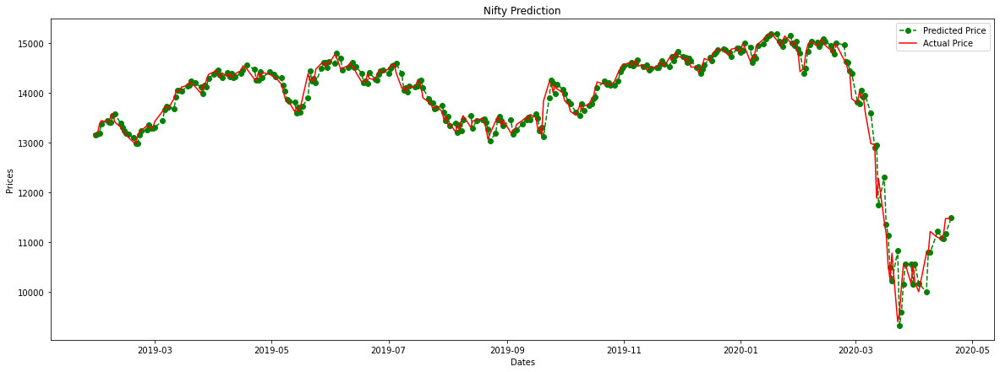

In [62]:
plt.figure(figsize=(20,7))
plt.plot(test_data.index[1:], predictions[1:], color='green', marker='o', linestyle='dashed',label='Predicted Price')
plt.plot(test_data.index, test_data, color='red', label='Actual Price')
plt.legend()
plt.title('Nifty Prediction')
plt.xlabel('Dates')
plt.ylabel('Prices')
# plt.xticks(np.arange(6386,7982, 300), df['Date'][6386:7982:300])
plt.legend()

In [63]:
from statsmodels.tsa.stattools import acf, pacf

In [64]:
train_ar = train_data.values
test_ar = test_data.values
history = [x for x in train_ar]
pred = list()

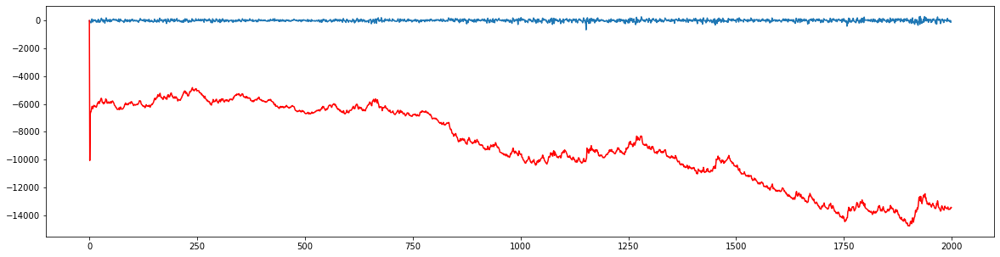

In [65]:
model = ARIMA(train_ar, order=(1, 2, 1))  
results_AR = model.fit()  
plt.figure(figsize=(20,5))
plt.plot(train_data.diff().dropna().values)
plt.plot(-1*results_AR.fittedvalues, color='red')

In [66]:
history[-1]

13343.0

In [67]:
train_ar[-1]

13343.0

In [68]:
test_ar[0]

13168.57

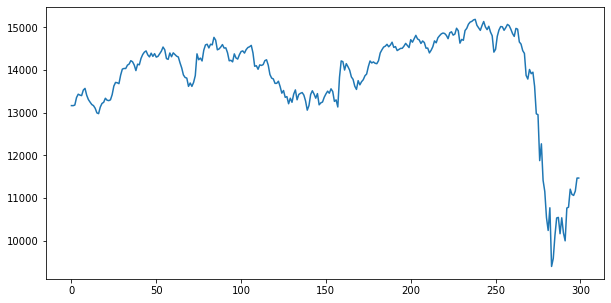

In [69]:
plt.plot(test_ar)

In [72]:
for i in range(10):
    model = ARIMA(history, order=(1,2,1))
    model_fit = model.fit()
    output = model_fit.forecast()
    pred.append(output[0])
    history.append(test_ar[i])
    print(output[0])

12980.898096428005
13192.426487199416
13170.22213129238
13185.575256811662
13380.378019760006
13447.332155594757
13415.349810708654
13404.264337772656
13549.002850467978
13579.54110421204


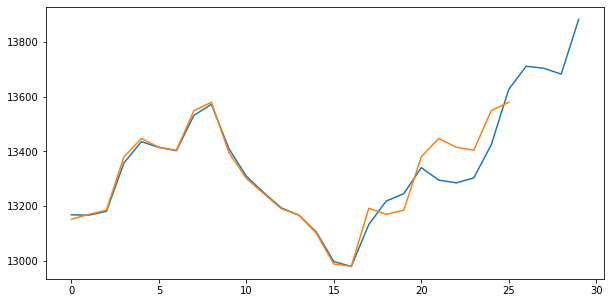

In [73]:
plt.plot(test_ar[:30])
plt.plot(pred[1:])

In [74]:
model = ARIMA(nifty['Total Returns Index'], order=(1,1,0))
model_fit = model.fit()
model_fit.summary()

C:\Users\dsanr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
C:\Users\dsanr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'
C:\Users\dsanr\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  warnings.warn('A date index has been provided, but it has no'


<class 'statsmodels.iolib.summary.Summary'>
"""
                                SARIMAX Results                                
===============================================================================
Dep. Variable:     Total Returns Index   No. Observations:                 2407
Model:                  ARIMA(1, 1, 0)   Log Likelihood              -14660.412
Date:                 Sat, 19 Sep 2020   AIC                          29324.824
Time:                         17:05:33   BIC                          29336.395
Sample:                              0   HQIC                         29329.033
                                - 2407                                         
Covariance Type:                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0278      0.010      2.664      0.008       0.007       0.048
sigma2      1.149e+04    109.330    105.078      0.000    1.13e+04    1.17e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):             51563.36
Prob(Q):                              0.91   Prob(JB):                         0.00
Heteroskedasticity (H):               5.73   Skew:                            -1.66
Prob(H) (two-sided):                  0.00   Kurtosis:                        25.43
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<AxesSubplot:ylabel='Density'>

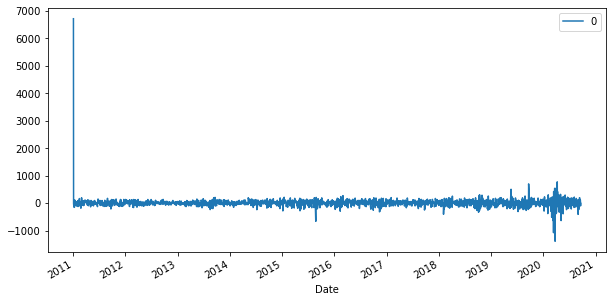

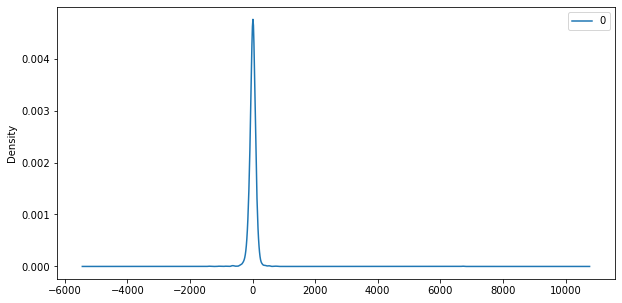

In [75]:
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
residuals.plot(kind='kde')